In [2]:
#importing required packages

import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import rfft, fft, ifft, fftfreq

In [3]:
# infilename = '/Users/user/Documents/VS Code/Radar/TSSat_20240321_1440_Cm_1333_astra1n_on.vdif'     #data set on which Justin's code works - useful for reference of what I am aiming for
infilename = '/Users/user/Documents/VS Code/Radar/DD18004_20241126_da_7167MHz_2026WB_10.vdif'

## Plotting a Spectrum

In [4]:
# Read header from an open VDIF file, and return a dict containing header data.
def readheader(infile):
  # Necessary munging of binary header to put it in the same layout as figure 3 in the format spec.
  # This was a bugger to get right.
  words = np.fromfile(infile, dtype=np.uint8, count=4*4)
  words = np.reshape(words, [4,4])[:,::-1]
  words = np.unpackbits(words, axis=1)

  header = {}

  # Parse word 0.
  header['invalid'] = words[0][0] # invalidity flag
  header['legacy'] = words[0][1] # legacy format flag
  words[0][:2] = 0 # erase flags to avoid contaminating first byte of second counter
  vals = np.packbits(words[0])
  header['seconds'] = sum(256**np.arange(3,-1,-1) * vals)

  # Parse word 1.
  assert words[1][0] == words[1][1] == 0, 'Unassigned bits should be zero.'
  header['epoch'] = np.packbits(words[1][:8])[0] # epoch in 6-month intervals from 1 Jan 2000
  vals = np.packbits(words[1][8:]) # remainder of word breaks cleanly at end of first byte
  header['framenum'] = sum(256**np.arange(2,-1,-1) * vals) # frame # within second

  # Parse word 2.
  vals = words[2][:3]
  header['version'] = sum(2**np.arange(2,-1,-1) * vals)
  assert header['version'] == 0, 'VDIF header version not supported.'
  vals = words[2][3:8] # bits in header actually represent log2(nchan)
  header['nchan'] = 2**sum(2**np.arange(4,-1,-1) * vals) # number of channels
  vals = np.packbits(words[2][8:]) # word breaks cleanly at end of first byte again
  header['framelen'] = sum(256**np.arange(2,-1,-1) * vals)*8 # frame length in bytes

  # Parse word 3.
  header['dtype'] = 'C' if words[3][0] else 'R' # complex or real data
  vals = words[3][1:6]
  header['nbits'] = sum(2**np.arange(4,-1,-1) * vals)+1 # sample size in bits
  vals = words[3][6:16]
  header['thread'] = sum(2**np.arange(9,-1,-1) * vals) # thread ID
  vals = np.packbits(words[3][16:]) # word breaks cleanly at end of second byte this time
  header['station'] = sum(256**np.arange(1,-1,-1) * vals) # station ID

  # Parse remaining words if necessary.
  if not header['legacy']:
    xwords = np.fromfile(infile, dtype=np.uint8, count=4*4)
    assert not xwords.sum(), 'Not set up to process extended user data.'

  # Derived values.
  header['headerlen'] = 16 + 16*(1 - header['legacy']) # bytes; full length of header
  header['datalen'] = header['framelen'] - header['headerlen'] # bytes; length of data only
  # Nicely-formatted dates, etc., would go here, derived from 'epoch' and 'seconds'.

  return header

# Read frames from an open VDIF file, up to the entire file, from specified starting frame.
def readframes(infile, header, nframes=99999999999, initframe=0):
  # Find file size.
  infile.seek(0,2)
  filesize = infile.tell()

  assert not filesize % header['framelen'], 'File size must be evenly divisible by frame length.'

  # Reading will start from initial frame.
  infile.seek(initframe*header['framelen'],0)
  # Do not read beyond end of file.
  nframes = min(nframes, filesize // header['framelen'] - initframe)

  raw = np.fromfile(infile, np.uint8, count=nframes*header['framelen'])
  raw = np.reshape(raw, [nframes, header['framelen']])

  # Extract parameters that vary between frames.
  # First, seconds from reference epoch.
  seconds = raw[:,3::-1]
  seconds = np.unpackbits(seconds, axis=1)
  seconds[:,:2] = 0 # blank out flags
  seconds = np.packbits(seconds, axis=1).astype(np.int64)
  seconds = 256**3*seconds[:,0] + 256**2*seconds[:,1] + 256**1*seconds[:,2] + 256**0*seconds[:,3]
  # Second, frame number within second.
  framenums = raw[:,6:3:-1].astype(np.int64)
  framenums = 256**2*framenums[:,0] + 256**1*framenums[:,1] + 256**0*framenums[:,2]
  # Third, thread ID.
  threads = raw[:,15:13:-1]
  threads = np.unpackbits(threads, axis=1)
  threads[:,:6] = 0 # blank out flag and sample size
  threads = np.packbits(threads, axis=1).astype(np.int64)
  threads = 256**1*threads[:,0] + 256**0*threads[:,1]

  framedata = raw[:,header['headerlen']:]

  return framedata, seconds, framenums, threads



# Sort frame data into separate sequences for each thread.
def sortframes(framedata, seconds, framenums, threads):
  ithreads = np.unique(threads)

  # Find separate index list for frames for each thread.
  lexinds = np.lexsort(( framenums, seconds ))
  inds = []
  for ithread in ithreads:
    tinds = lexinds[np.where(threads[lexinds] == ithread)]
    inds.append(tinds)

  # Trim mismatched preceding frames.
  fseconds   = seconds  [[tinds[0] for tinds in inds]]
  fframenums = framenums[[tinds[0] for tinds in inds]]
  while len(np.unique(fseconds)) > 1 or len(np.unique(fframenums)) > 1:
    ftind = np.lexsort(( fframenums, fseconds ))[0]
    inds[ftind] = inds[ftind][1:]
    fseconds   = seconds  [[tinds[0] for tinds in inds]]
    fframenums = framenums[[tinds[0] for tinds in inds]]

  # Trim mismatched following frames.
  fseconds   = seconds  [[tinds[-1] for tinds in inds]]
  fframenums = framenums[[tinds[-1] for tinds in inds]]
  while len(np.unique(fseconds)) > 1 or len(np.unique(fframenums)) > 1:
    ftind = np.lexsort(( fframenums, fseconds ))[-1]
    inds[ftind] = inds[ftind][:-1]
    fseconds   = seconds  [[tinds[-1] for tinds in inds]]
    fframenums = framenums[[tinds[-1] for tinds in inds]]

  for ithread,tinds in zip(ithreads,inds):
    assert max(np.diff(seconds[tinds])) <= 1, 'Missing data in thread %d.' % ithread
  # Note that this check will not notice if the missing frame is the final frame in a second.

  assert len(np.unique([len(tinds) for tinds in inds])) == 1, 'Different numbers of frames in different threads.'
  inds = np.array(inds) # we can do this now that we know the array is perfectly rectangular

  nthreads = len(ithreads)
  assert ithreads.max() == nthreads-1, 'Discontiguous thread numbering.'
  # Assumed from this point onward.

  # Copy out thread data.
  framelen = np.shape(framedata)[1]
  nframes = np.shape(inds)[1]
  threaddata = np.zeros([nthreads,nframes,framelen], dtype=framedata.dtype)

  for ithread,tinds in enumerate(inds):
    for iframe,tind in enumerate(tinds):
      threaddata[ithread,iframe,:] = framedata[tind,:]

  threaddata = np.reshape(threaddata, [len(ithreads), nframes*framelen])

  return threaddata

def unpacksamps(samps, nbits, dtype):
  assert nbits == 2, 'Unpacking procedure is hard-coded for 2-bit samples.'
  assert dtype == 'R', 'Unpacking procedure assumes real samples.'
  assert len(np.shape(samps)) == 1, 'Unpacking procedure is written for one-dimensional arrays.'

  nmax = 2**24 # max bytes to unpack at a time

  if len(samps) <= nmax:
    samps = np.unpackbits(samps)
    samps = 2*samps[0::2] + samps[1::2]

    # Reorder 1-byte chunks.
    samps = np.reshape(samps, [int(len(samps)/4), 4])
    samps = samps[:,::-1]
    samps = np.reshape(samps, np.size(samps))

    return samps
  
   # We have a large amount of data.  Do it a chunk at a time.

  oldsamps = samps
  samps = np.zeros(len(oldsamps)*4, dtype=np.uint8)
  isamp = 0

  while len(oldsamps):
    tmpsamps = oldsamps[:nmax]
    oldsamps = oldsamps[nmax:]

    tmpsamps = unpacksamps(tmpsamps, nbits, dtype)

    samps[isamp:isamp+len(tmpsamps)] = tmpsamps
    isamp += len(tmpsamps)

  return samps


In [18]:
# Open file and get header info.
infile = open(infilename)
header = readheader(infile)

# Get data from file.
framedata, seconds, framenums, threads = readframes(infile, header)
infile.close() # finished with file

# Sort into streams for separate threads.
threaddata = sortframes(framedata, seconds, framenums, threads)

# Unpack 2-bit data for first thread(/polarisation).
pola = unpacksamps(threaddata[0,:], header['nbits'], header['dtype'])
# At this point, we have true, sequential sample values for a single polarisation.
#polb = unpacksamps(threaddata[1,:], header['nbits'], header['dtype'])


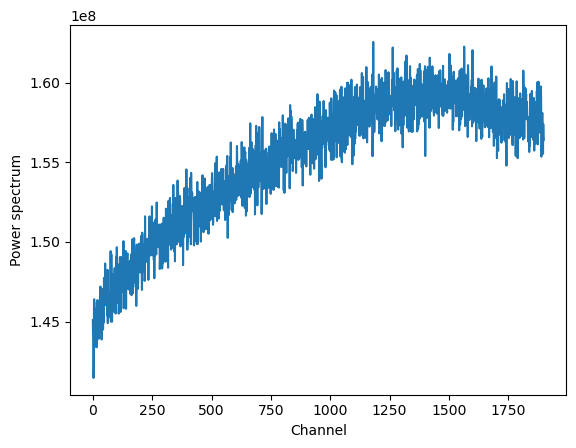

In [6]:
#Don't run
#Justin's code to plot spectra
#Not sure what that means or what is does

# Truncate and switch to floating point to make plotting easier.
Fs=4e06  #sampling frequency
duration = 267.36
frequency = 7167e6
PRI=0.01*Fs
start=int(5*Fs) 
end=start+int(2048*PRI)  
plotvals = pola[start:end] # truncate
plotvals = plotvals.astype(np.float32) - 1.5

# Show spectrum.
spec = rfft(plotvals)
spec = abs(spec)**2 # power spectrum
spec = spec[:-1] # remove final value

# Reduce resolution.
nfreqs = 2048
assert not len(spec) % nfreqs
spec = np.reshape(spec, [nfreqs, int(len(spec)/nfreqs)])
spec = spec.mean(axis=-1)

# plt.xlim(-10,100)
plt.xlabel('Channel')
plt.ylabel('Power spectrum')

#   plt.plot(spec[1024-10:1024+10])

#   plt.savefig('vdif_plot.pdf')
plt.plot(spec[100:2000])
plt.show()

In [19]:
#first chopping 

pola_reduced = pola[0:1068000000]
result = np.zeros((267, 2000001))
dat = pola_reduced.reshape((267, 4000000))


In [ ]:
for i in range(267):
    result[i] = rfft(dat[i])

In [8]:
out = (np.abs(result))**2
# plt.imshow(out[:, ::1000], vmin= 0.8e6, vmax=10000000, cmap='rainbow', origin='lower')
# plt.colorbar()

In [43]:
midpoint = 2000001/2
#using speed at 18:15 
s = 0.2327428 *10**3 * 2 / 3e8 *  7167e6
s2 = 0.2308106 *10**3 *2 /3e8 *7167e6
d1 = midpoint - (s)
d2 = midpoint + (s)
d1, d2

(1988880.049016, 2011120.950984)

In [44]:
#finding plotting boundaries for both sides of the centre

low = int(d1-500)
high = int(d1+500)

low2 = int(d2-500)
high2 = int(d2+500)

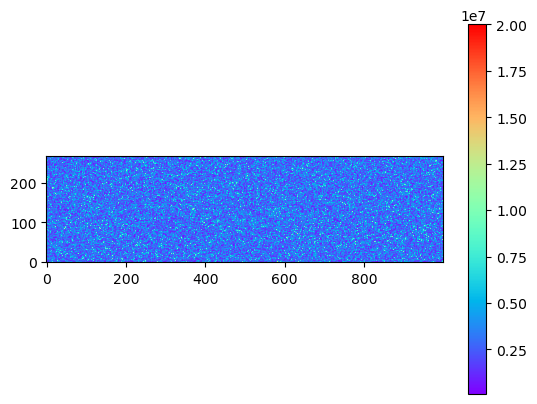

In [48]:
plt.imshow(out[:, low:high], vmin= 1e5, vmax=2e7, cmap='rainbow', origin='lower')
plt.colorbar()

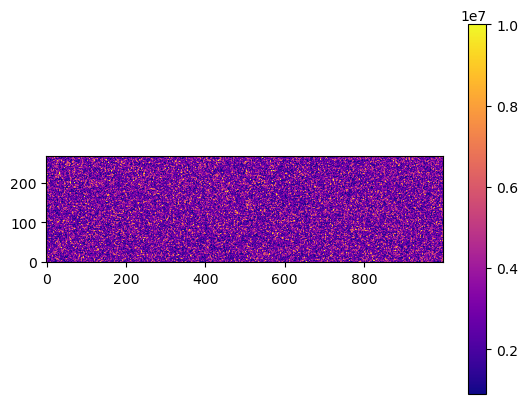

In [47]:
plt.imshow(out[:, low2:high2], vmin= 0.9e6, vmax=10e6, cmap='plasma', origin='lower')
plt.colorbar()

In [14]:
# deramping

fs = 4e6 
T = 60
f0 = 7166988879.549016 
f1 = 7166988971.869532 
t = np.linspace(0, T, int(fs * T), endpoint=False)
a = (f1-f0)/T
negative_chirp = np.exp(-1j*2*np.pi* (f0*t + 0.5*a* t**2))

In [34]:
minute = pola[0:240000000]
deramp = minute*negative_chirp

In [38]:
deramp = deramp.reshape((60, 4000000))
deramp_out = np.zeros((60, 4000000))
for i in range(60):
    deramp_out[i] = fft(deramp[i])
deramp_out = (np.abs(deramp_out))**2

/var/folders/j_/1ngjj5717s1dld59gj3r9vx00000gp/T/ipykernel_3261/1121821331.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  deramp_out[i] = fft(deramp[i])


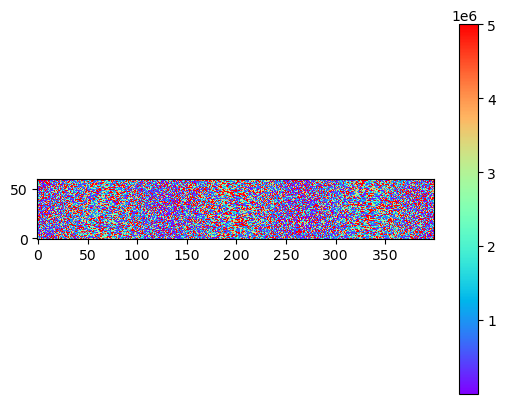

In [53]:
plt.imshow(deramp_out[:, ::10000], vmin= 1e2, vmax=5e6, cmap='rainbow', origin='lower')
plt.colorbar()

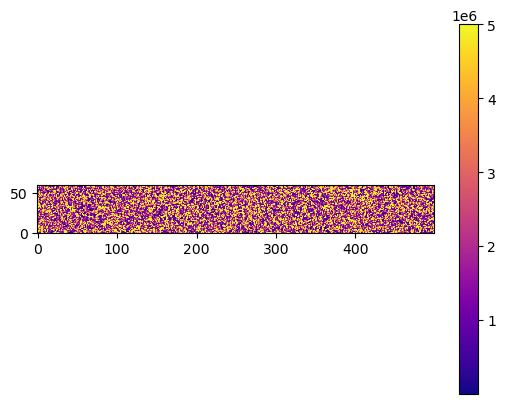

In [54]:
plt.imshow(deramp_out[:, low2+250:high2-250], vmin= 1e2, vmax=5e6, cmap='plasma', origin='lower')
plt.colorbar()

#### Plotting small sections of the stacked spectra to see if a signal can be found

1050000 1051000


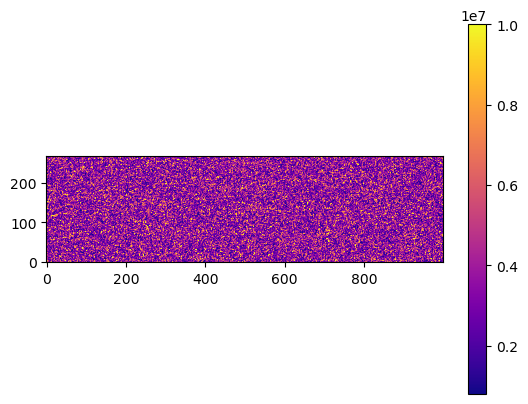

1051000 1052000


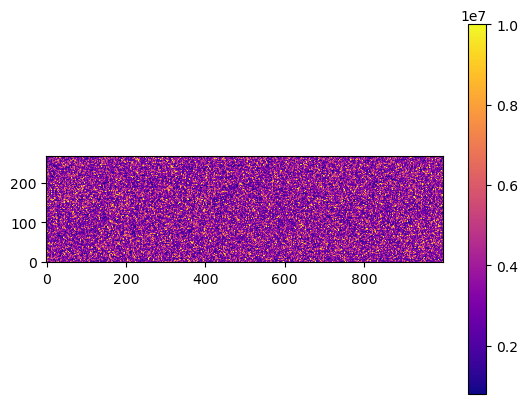

1052000 1053000


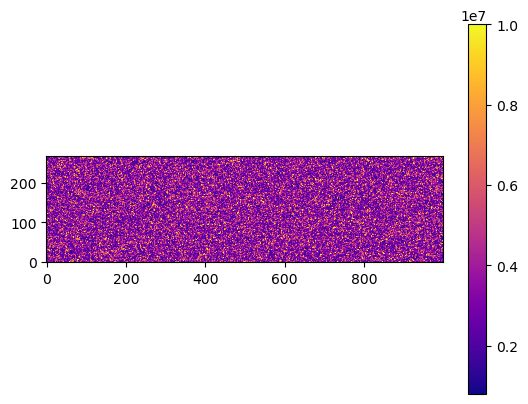

1053000 1054000


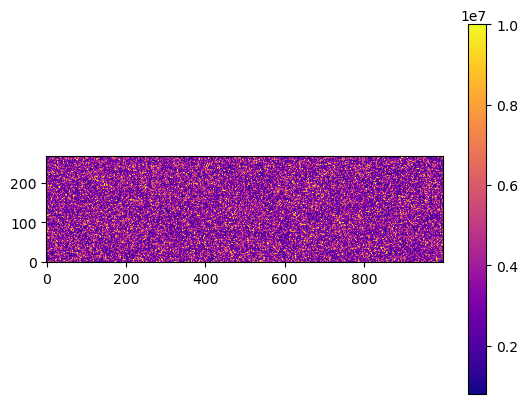

1054000 1055000


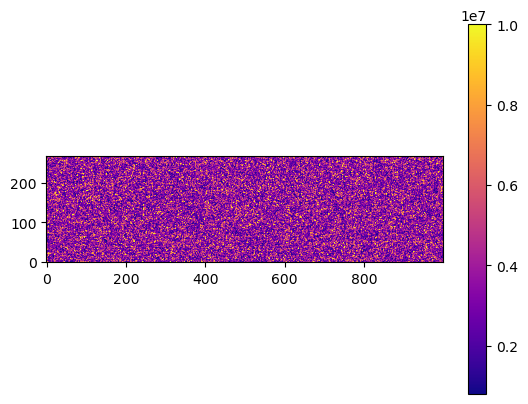

1055000 1056000


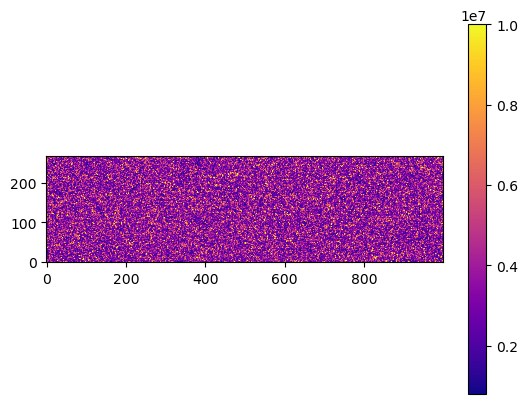

1056000 1057000


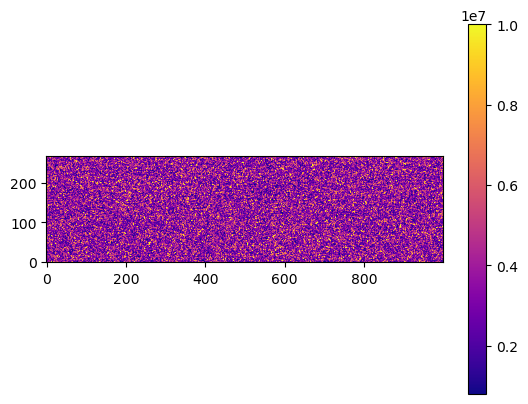

1057000 1058000


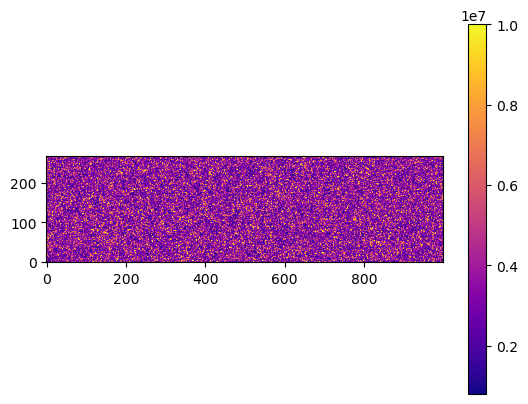

1058000 1059000


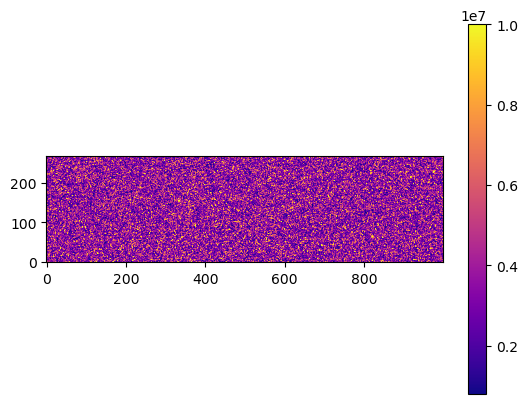

1059000 1060000


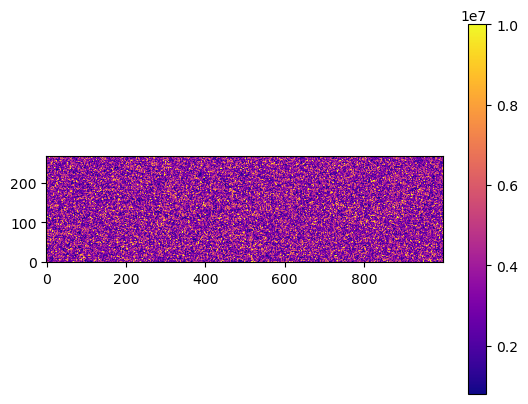

1060000 1061000


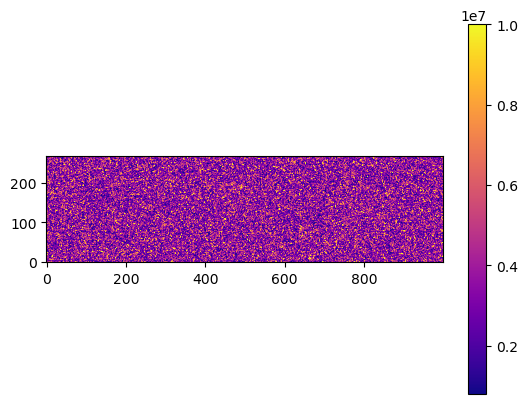

1061000 1062000


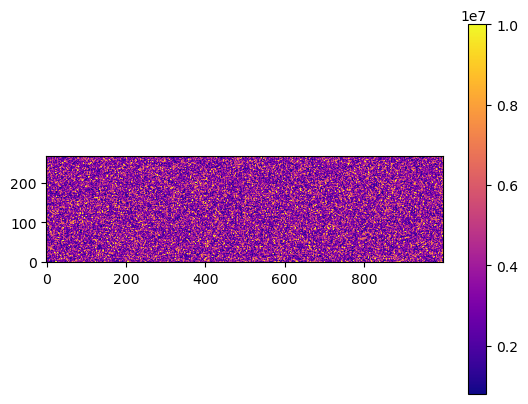

1062000 1063000


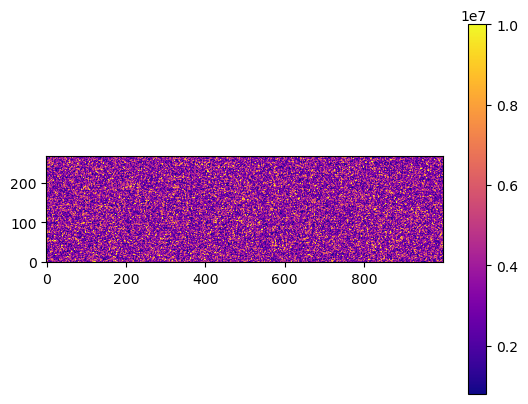

1063000 1064000


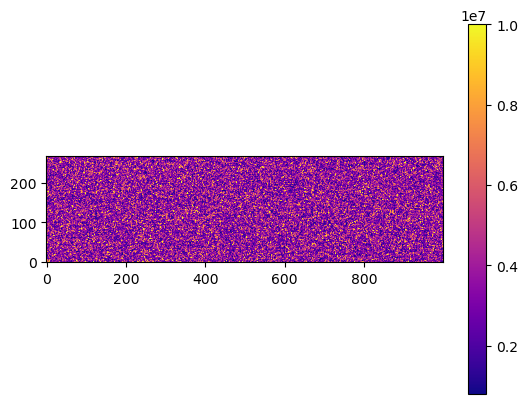

1064000 1065000


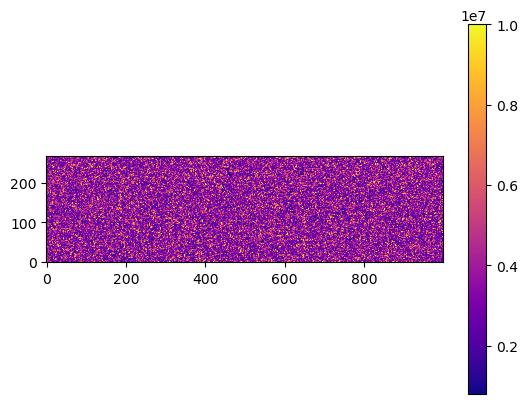

1065000 1066000


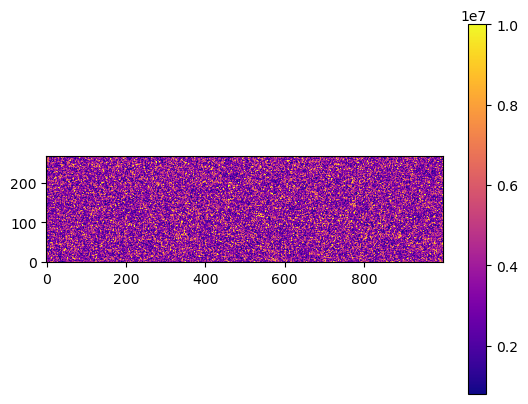

1066000 1067000


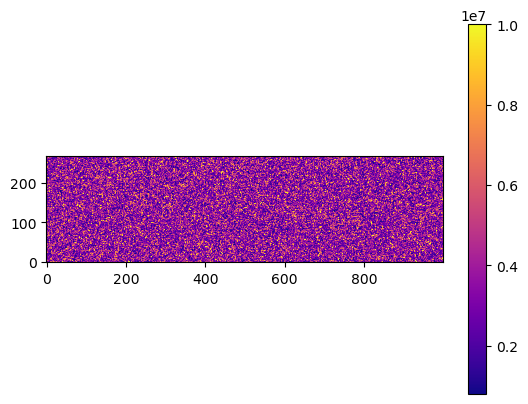

1067000 1068000


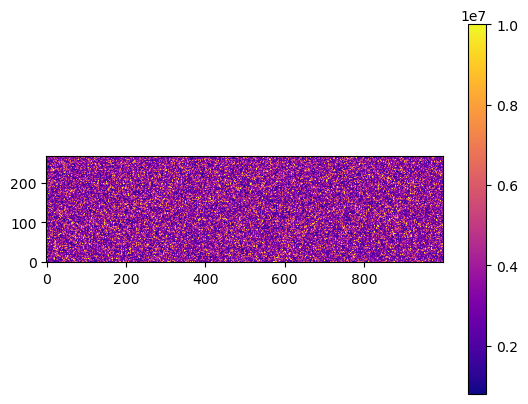

1068000 1069000


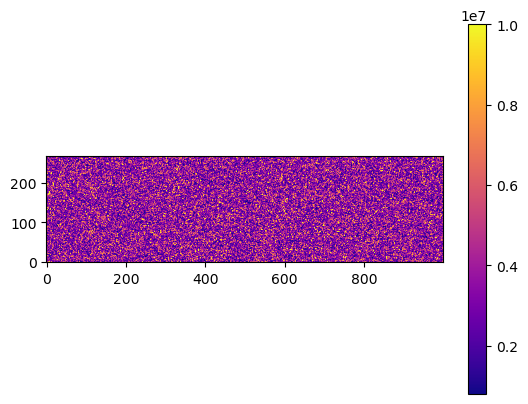

1069000 1070000


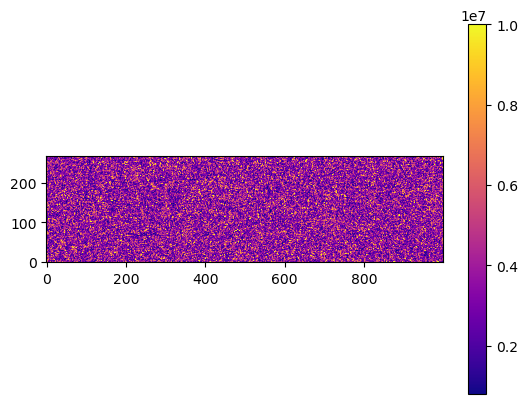

1070000 1071000


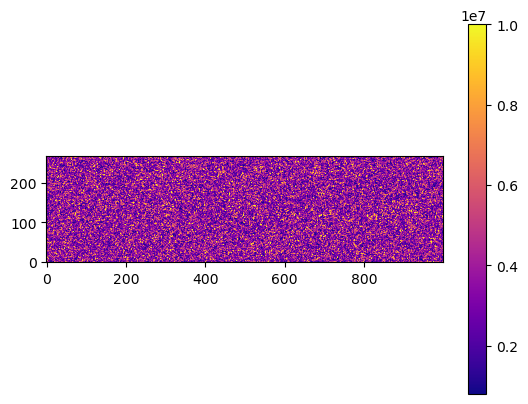

1071000 1072000


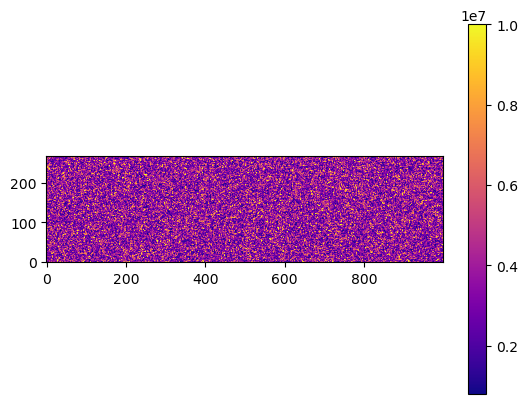

1072000 1073000


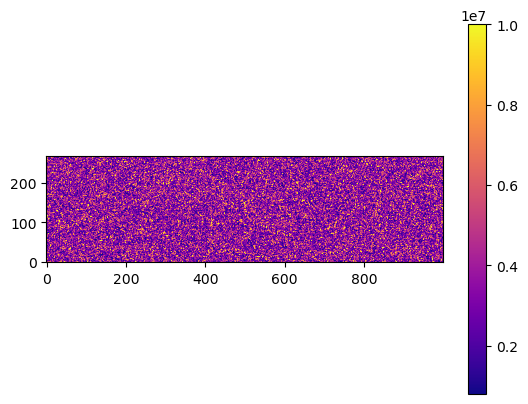

1073000 1074000


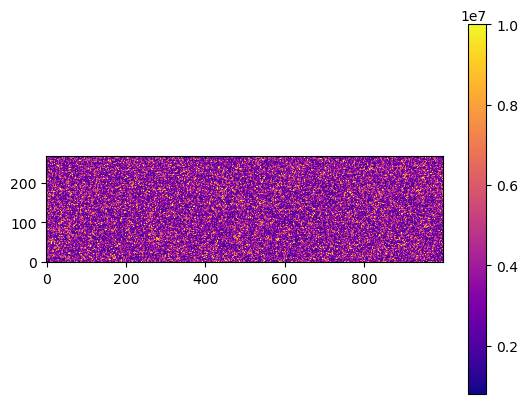

1074000 1075000


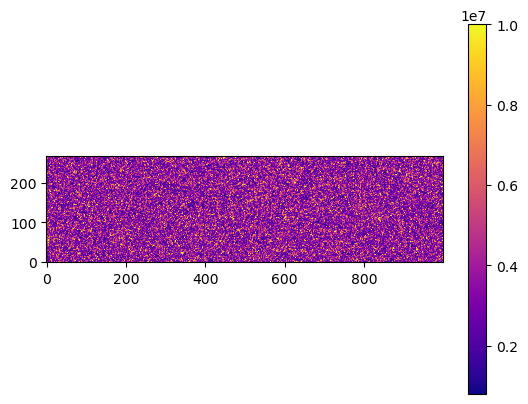

1075000 1076000


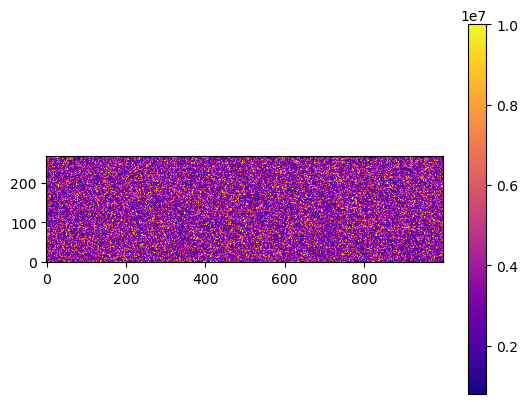

1076000 1077000


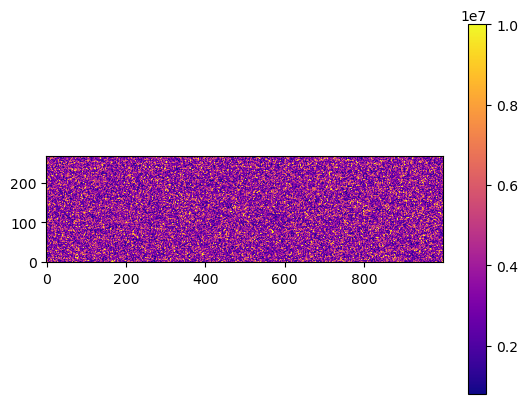

1077000 1078000


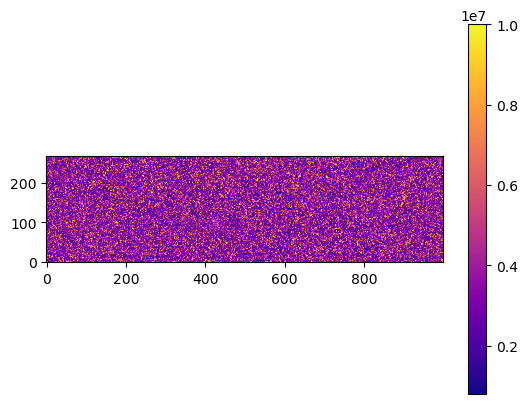

1078000 1079000


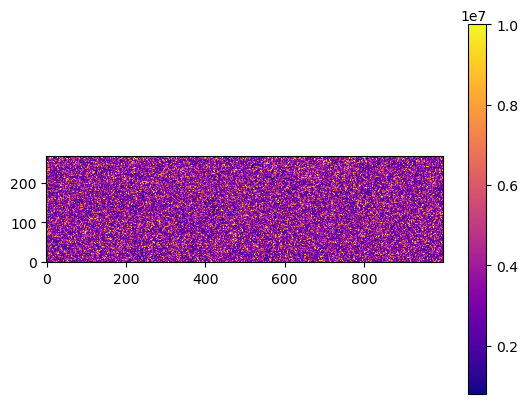

1079000 1080000


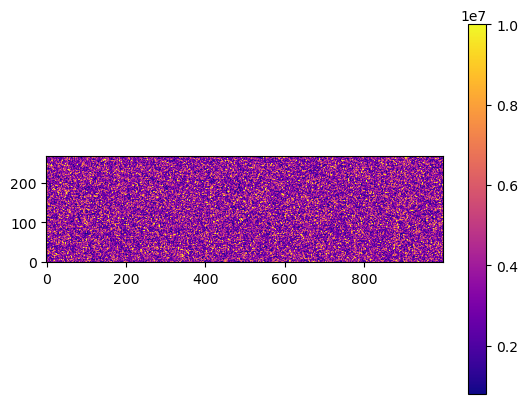

1080000 1081000


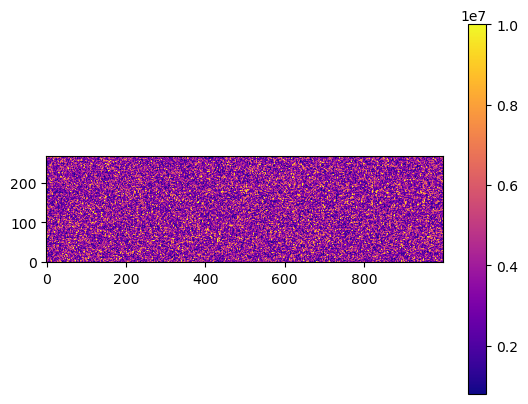

1081000 1082000


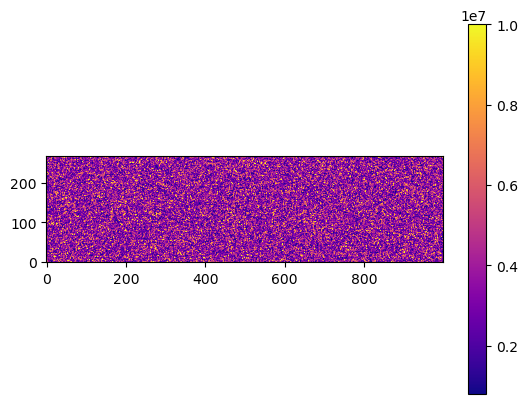

1082000 1083000


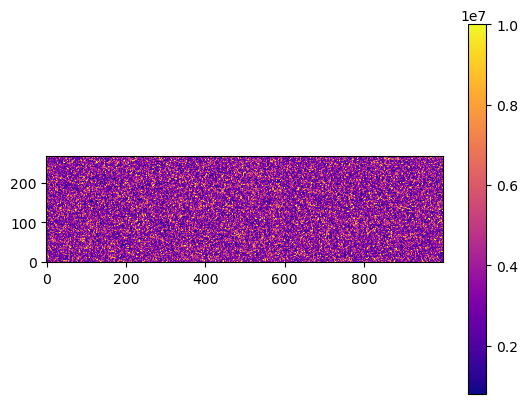

1083000 1084000


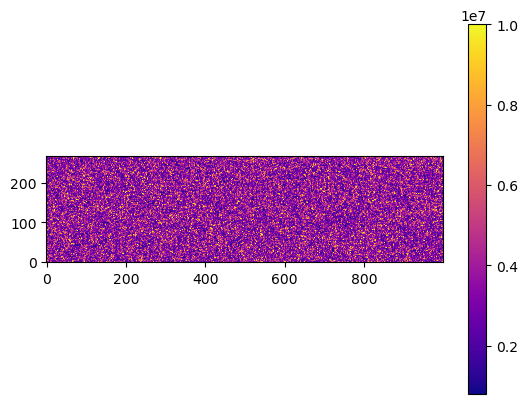

1084000 1085000


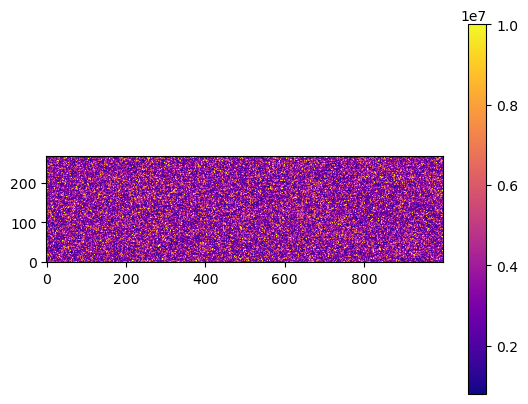

1085000 1086000


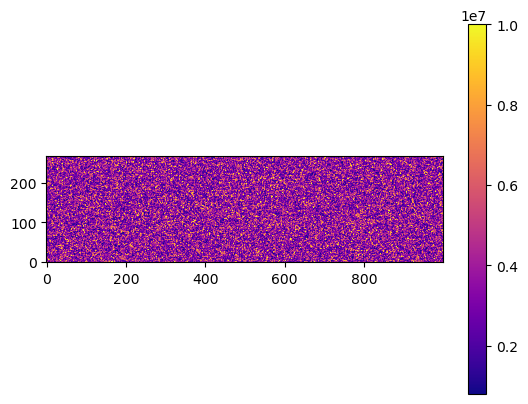

1086000 1087000


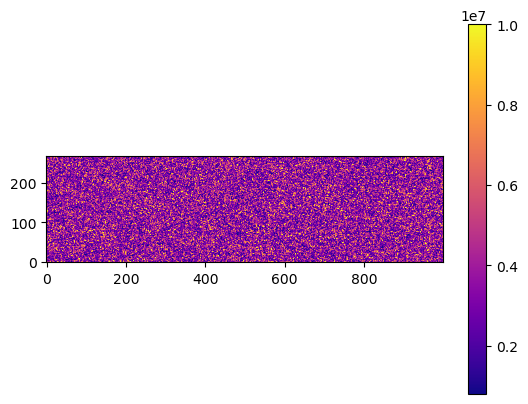

1087000 1088000


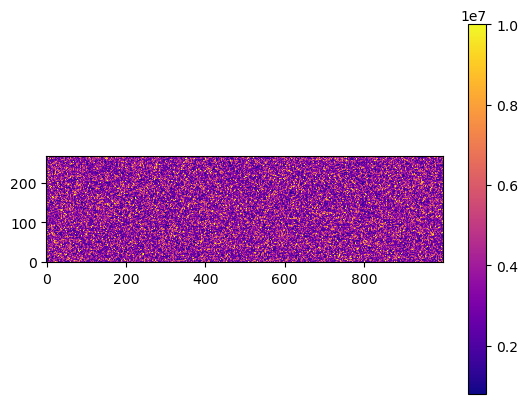

1088000 1089000


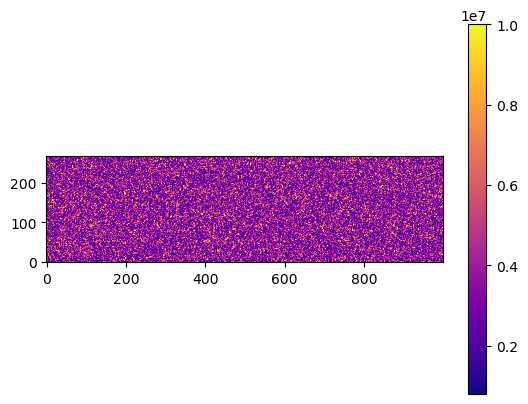

1089000 1090000


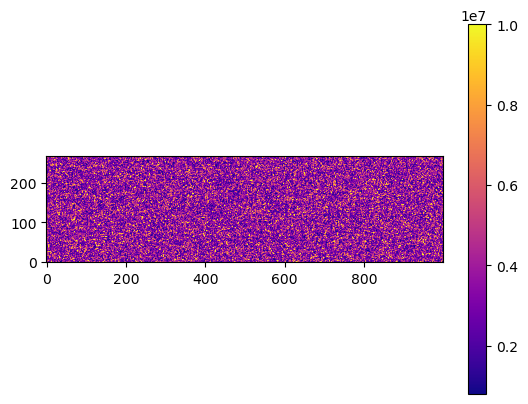

1090000 1091000


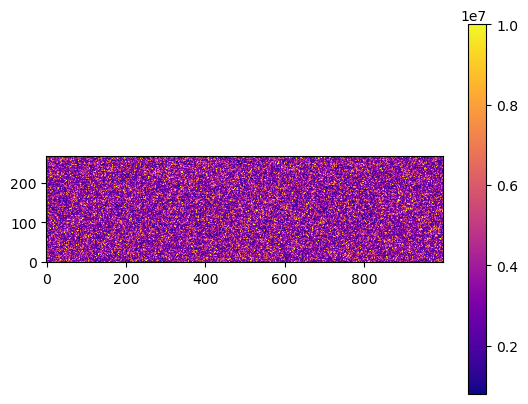

1091000 1092000


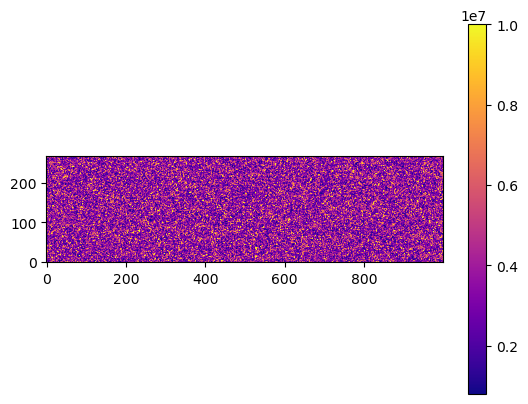

1092000 1093000


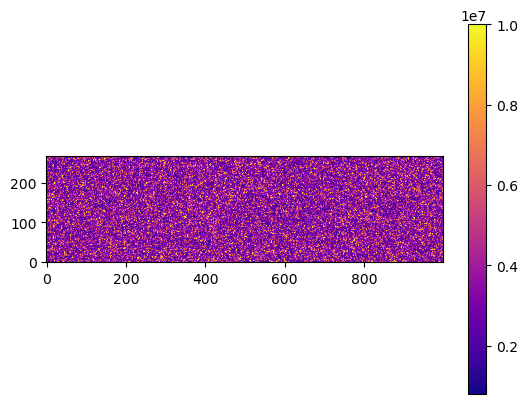

1093000 1094000


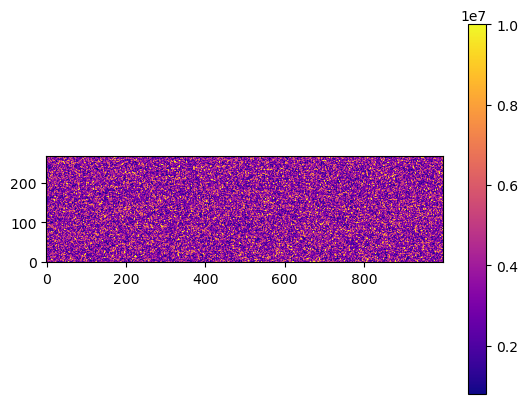

1094000 1095000


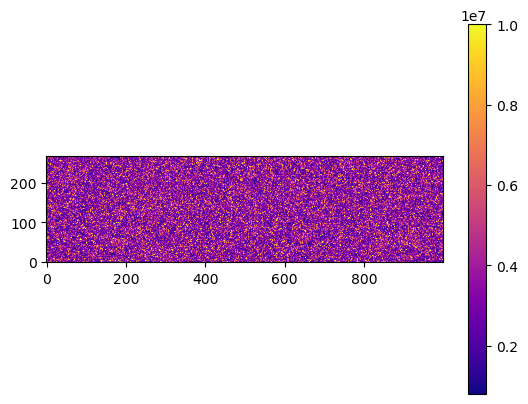

1095000 1096000


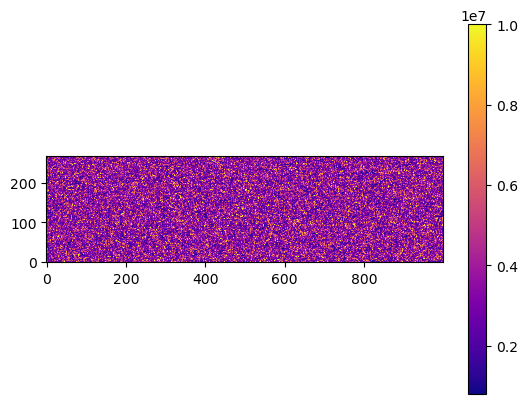

1096000 1097000


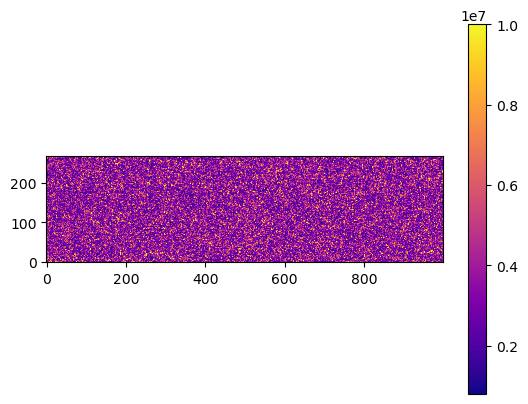

1097000 1098000


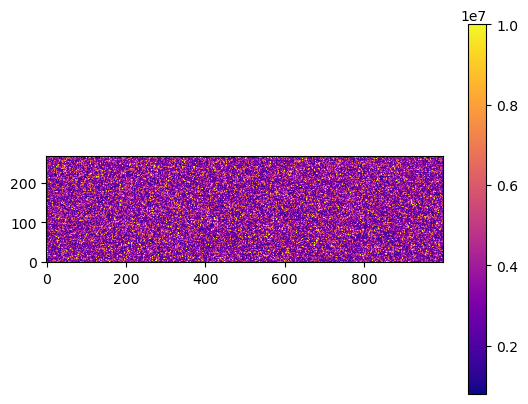

1098000 1099000


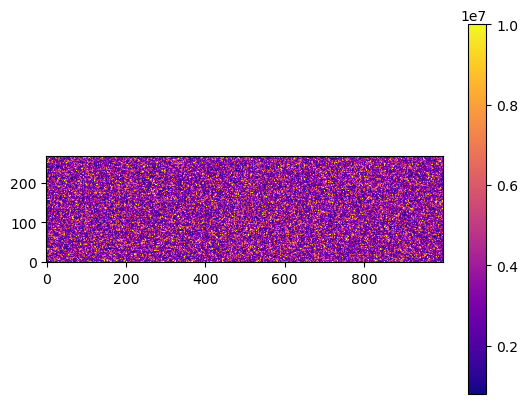

1099000 1100000


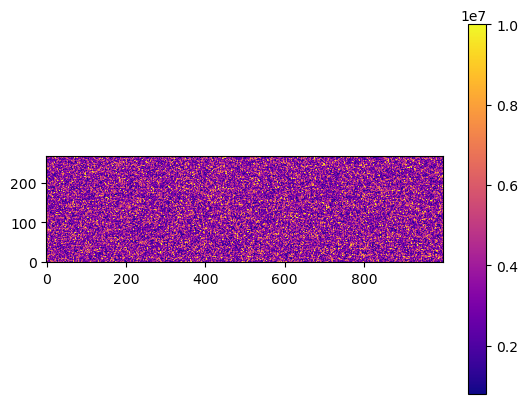

In [54]:
low = 1050000
high = 1051000
for j in range(50):
    plt.imshow(out[:, low:high], vmin=0.8e6, vmax=10000000, origin='lower', cmap='plasma')
    print(low, high)
    plt.colorbar()
    plt.show()
    low +=1000
    high +=1000

/Users/user/anaconda3/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/user/anaconda3/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


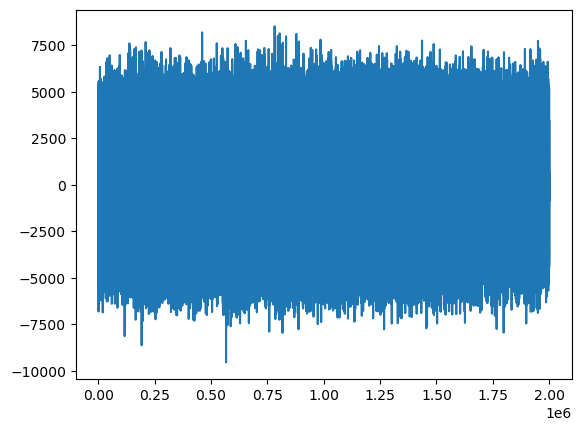

In [41]:
fft_result = rfft(pola_reduced)
plt.plot(fft_result[10:])

## Range and Range-rate

Used JPL Horizons to find the range and range-rate of 2006WB from the Lovell between 16:45 and 19:15 on 26/11/24 with a step of 1 minute.

In [43]:
#unpack text document into range and range rate
#NB: range is in units of e5 km and range-rate is in units of km/s
r, rangeRate = np.loadtxt('/Users/user/Documents/VS Code/Radar/2006WB_Range+Range-rate.txt', unpack=True)

Text(0, 0.5, 'Range x $10^5$ km')

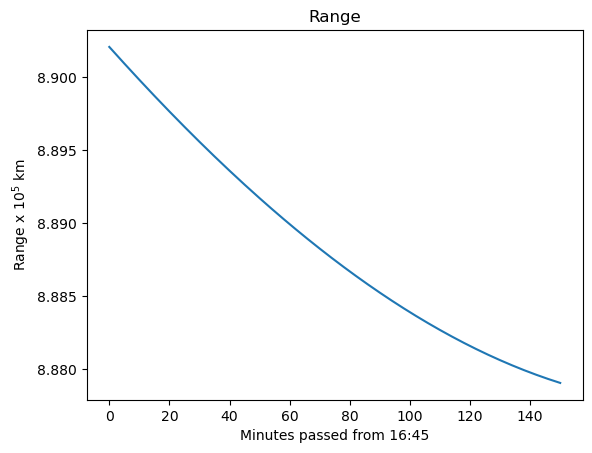

In [38]:
plt.plot(r)
plt.title('Range')
plt.xlabel('Minutes passed from 16:45')
plt.ylabel('Range x $10^5$ km')

Text(0, 0.5, 'Range-rate km/s')

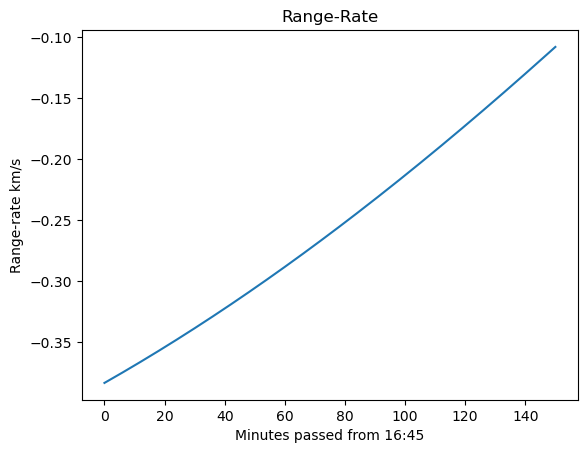

In [39]:
plt.plot(rangeRate)
plt.title('Range-Rate')
plt.xlabel('Minutes passed from 16:45')
plt.ylabel('Range-rate km/s')

### Doppler Shift

$f_D = \frac{2v}{\lambda}cos \psi cos (\frac{\beta}{2})$  

Where $f_D$ is the Doppler shift, $v$ is the target velocity, $\psi$ is the angle between the target velocity vector and the mid point of the angle between the transmitter and receiver and $\beta$ is the angle between the target and the receiver.

In [44]:
rob_range_rate = [-0.4620405, -0.4606355, -0.4592224, -0.4578013, -0.4563722, -0.4549350, -0.4534898, -0.4520366, -0.4505754, -0.4491062, -0.4476290, -0.4461438, -0.4446507, -0.4431495, -0.4416404, -0.4401234, -0.4385983, -0.4370654, -0.4355245, -0.4339756, -0.4324189, -0.4308542, -0.4292816, -0.4277012, -0.4261128, -0.4245166, -0.4229125, -0.4213005, -0.4196807, -0.4180531, -0.4164176, -0.4147743, -0.4131232, -0.4114643, -0.4097976, -0.4081231, -0.4064409, -0.4047509, -0.4030531, -0.4013476, -0.3996345, -0.3979135, -0.3961849, -0.3944487, -0.3927047, -0.3909531, -0.3891938, -0.3874269, -0.3856524, -0.3838702, -0.3820805, -0.3802832, -0.3784783, -0.3766658, -0.3748458, -0.3730183, -0.3711833, -0.3693408, -0.3674908, -0.3656333, -0.3637684, -0.3618960, -0.3600162, -0.3581290, -0.3562344, -0.3543325, -0.3524231, -0.3505065, -0.3485825, -0.3466511, -0.3447125, -0.3427667, -0.3408135, -0.3388531, -0.3368855, -0.3349107, -0.3329287, -0.3309395, -0.3289431, -0.3269396, -0.3249290, -0.3229113, -0.3208865, -0.3188547, -0.3168158, -0.3147698, -0.3127169, -0.3106570, -0.3085901, -0.3065163, -0.3044355, -0.3023478, -0.3002533, -0.2981518, -0.2960436, -0.2939285, -0.2918066, -0.2896779, -0.2875424, -0.2854002, -0.2832513, -0.2810956, -0.2789333, -0.2767644, -0.2745888, -0.2724066, -0.2702178, -0.2680224, -0.2658205, -0.2636120, -0.2613971, -0.2591757, -0.2569478, -0.2547135, -0.2524728, -0.2502257, -0.2479723, -0.2457125, -0.2434464, -0.2411740, -0.2388954, -0.2366105, -0.2343194, -0.2320221, -0.2297186, -0.2274090, -0.2250933, -0.2227715, -0.2204437, -0.2181098, -0.2157698, -0.2134239, -0.2110721, -0.2087143, -0.2063506, -0.2039810, -0.2016055, -0.1992243, -0.1968372, -0.1944443, -0.1920457, -0.1896414, -0.1872314, -0.1848157, -0.1823944, -0.1799674, -0.1775349, -0.1750968, -0.1726532, -0.1702041, -0.1677496]
rob_range_rate = [i*10**3 for i in rob_range_rate]
rangeRate = [i*10**3 for i in rangeRate]

In [36]:
delta_dot = [x + y for x, y in zip(rangeRate, rob_range_rate)]

In [37]:
frequency = 7167e6
delta_dot = [i/3e8 for i in delta_dot]
delta_dot = [i*frequency for i in delta_dot]

In [45]:
#Just estimating shift as I am not sure how to find ψ
frequency = 7167e6
shift = ((rob_range_rate[0]+rangeRate[0])/3e8) * frequency

In [76]:
s = -0.2327428 *10**3 * 2 / 3e8 * frequency

In [46]:
shift

-20192.365525

In [38]:
np.mean(delta_dot)

-1395081.704113245

## Histograms of the Raw Output

As part of the investigation into what is going on, I plotted histograms of the raw output. These should be centred in the middle with the outer two bins less full however this does not seem to be the case. This is a little concerning.

Nick thinks that the automatic gain has gotten stuck and so will need to be reset by restarting the correlator.

In [18]:
np.unique(pola)

array([0, 1, 2, 3], dtype=uint8)

(array([2.50117480e+08, 0.00000000e+00, 0.00000000e+00, 1.48173171e+08,
        0.00000000e+00, 0.00000000e+00, 1.72345592e+08, 0.00000000e+00,
        0.00000000e+00, 4.98803757e+08]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

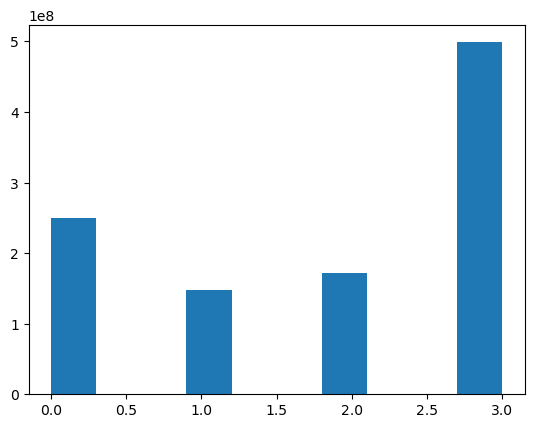

In [25]:
plt.hist(pola)

Text(0.5, 1.0, 'DD18004_20241126_da_7167MHz_2026WB_10')

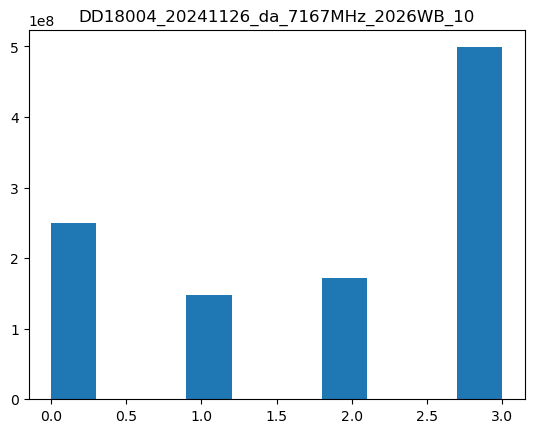

In [51]:
plt.hist(pola)
plt.title('DD18004_20241126_da_7167MHz_2026WB_10')

## Pulse Compression

Applying matched filtering using eq 11 from Primer to start with

Also ned to apply downconversion

In [8]:
fc = frequency - 2e6
Tp = 267.36
bandwidth = 2e6
alpha = bandwidth/Tp

In [17]:
t_dot = 0
#t_dot = rangeRate
t = np.linspace(0, Tp, 4000000)

In [1]:
def rect(x):
    return np.where(np.abs(x)<=0.5, 1, 0)

In [18]:
h1 = np.exp(-2j*np.pi*fc*t_dot*t)
h2 = np.exp(1j*np.pi*alpha*(1-t_dot)**2*t**2)
h3 = rect(t/(Tp*(1+t_dot)))
h = h1*h2*h3

In [20]:
h_star = np.conj(h)
filter = fft(h_star)

In [27]:
result = np.zeros((267, 4000000))

In [29]:
for i in range(267):
    data = dat[i]
    f = fft(data)
    temp = ifft(f*filter)
    result[i] = temp

/var/folders/j_/1ngjj5717s1dld59gj3r9vx00000gp/T/ipykernel_37072/2422607585.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = temp


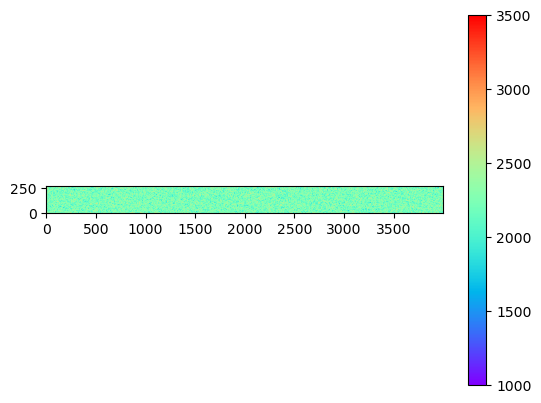

In [33]:
plt.imshow(result[:, ::1000], vmin=1000, vmax=3500, cmap='rainbow', origin='lower')
plt.colorbar()

1000000 1001000


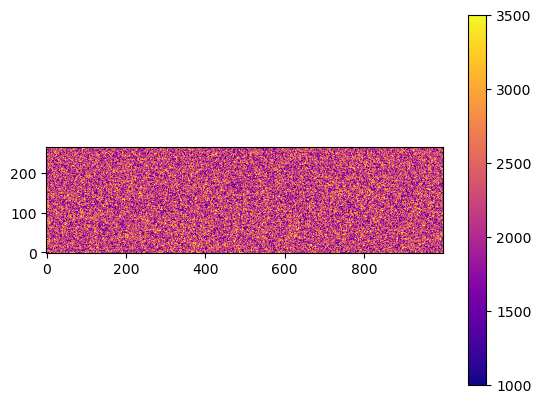

1001000 1002000


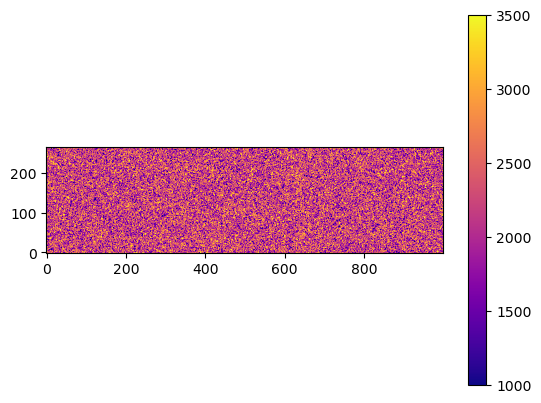

1002000 1003000


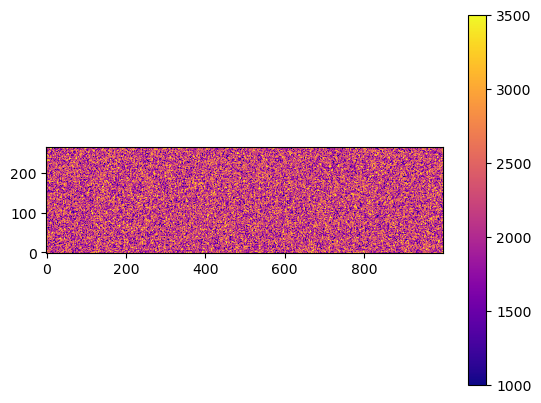

1003000 1004000


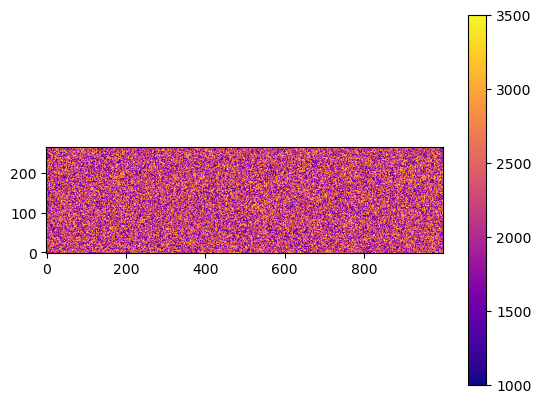

1004000 1005000


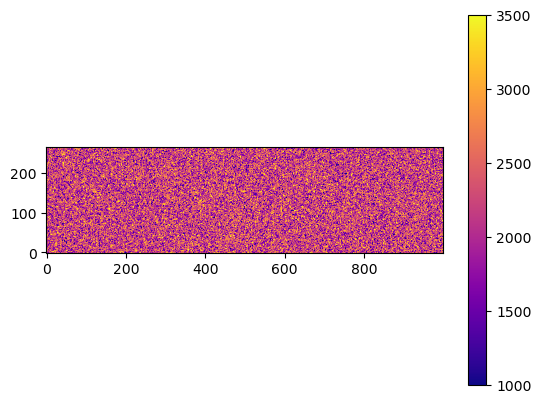

1005000 1006000


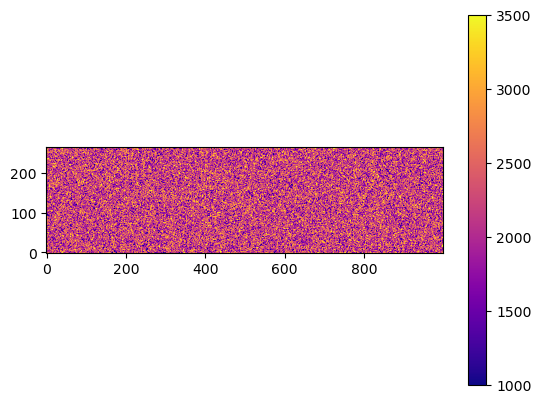

1006000 1007000


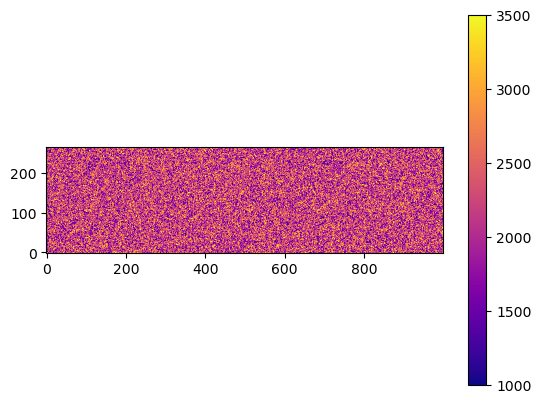

1007000 1008000


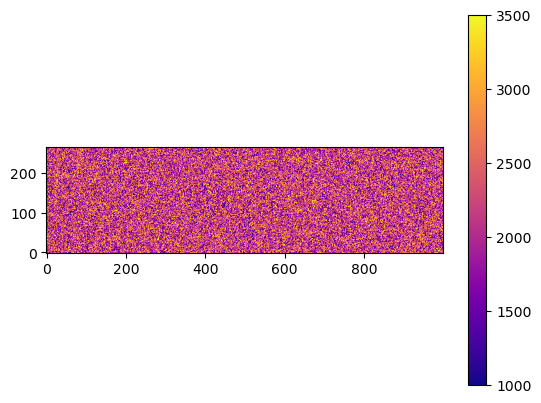

1008000 1009000


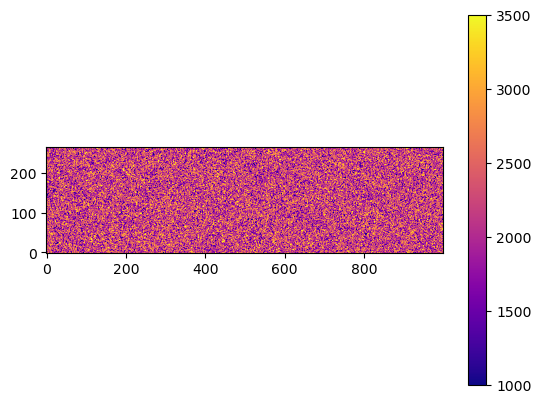

1009000 1010000


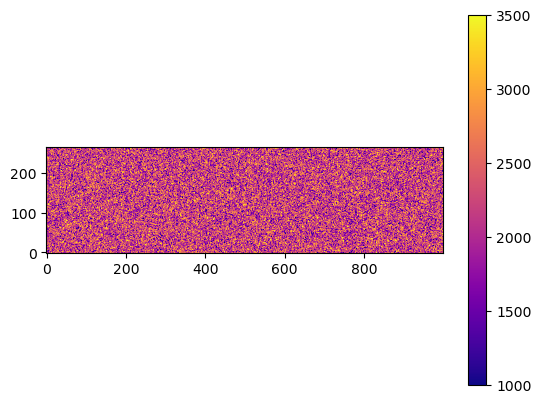

1010000 1011000


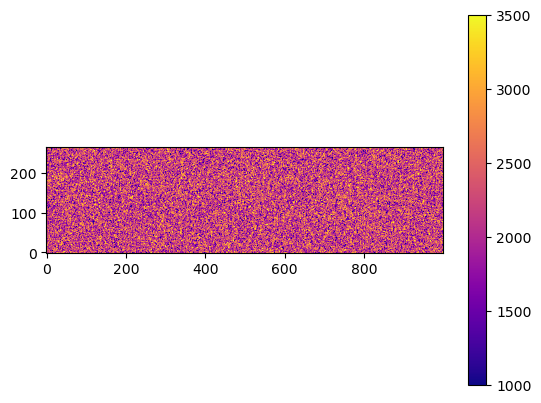

1011000 1012000


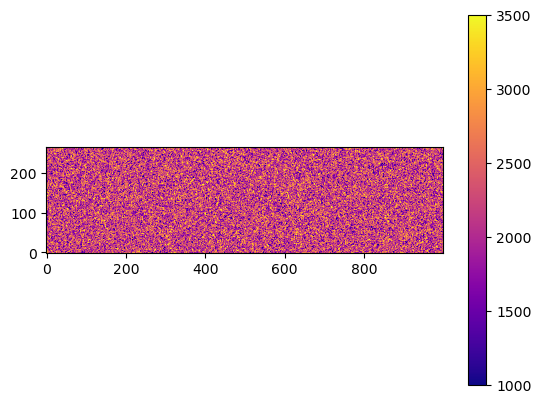

1012000 1013000


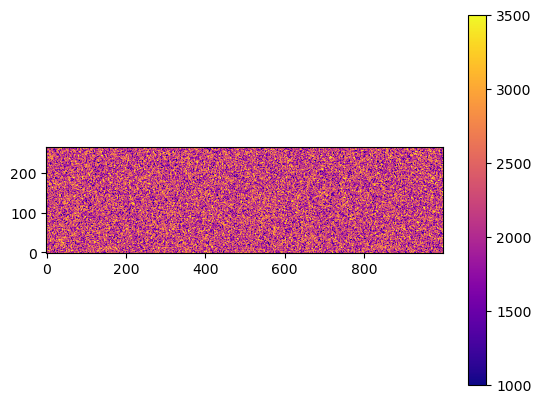

1013000 1014000


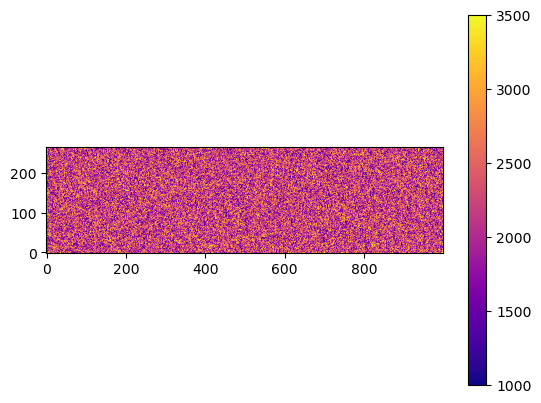

1014000 1015000


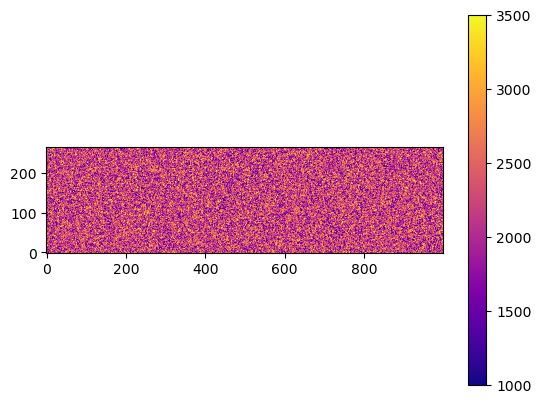

1015000 1016000


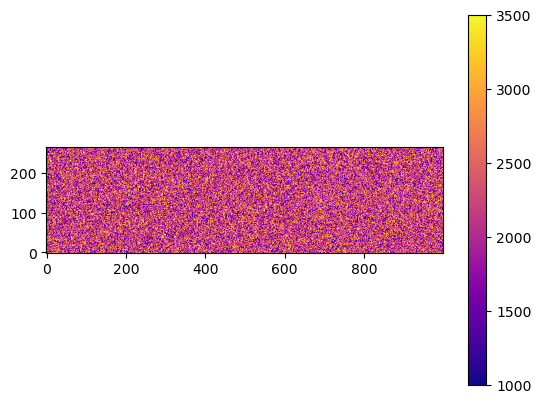

1016000 1017000


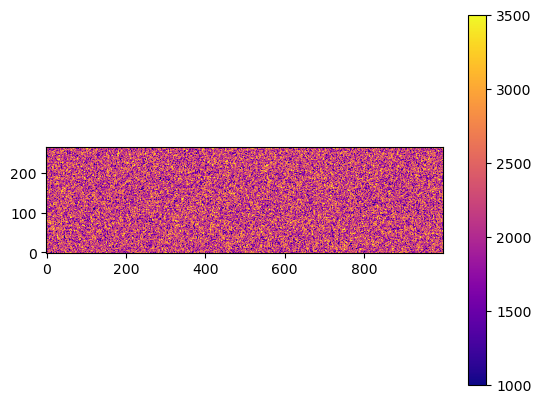

1017000 1018000


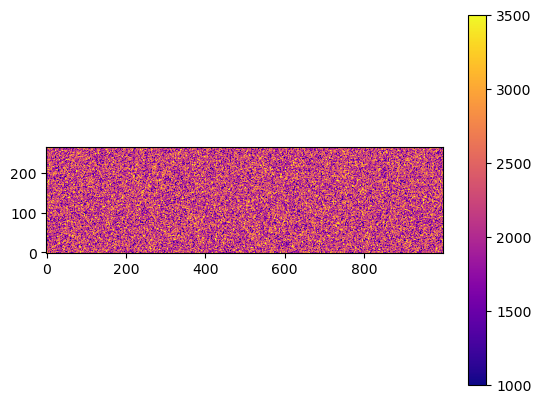

1018000 1019000


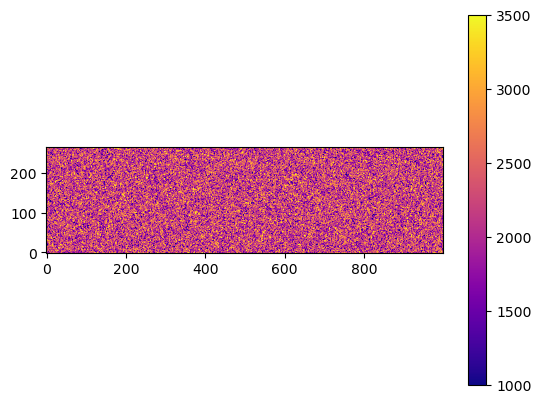

1019000 1020000


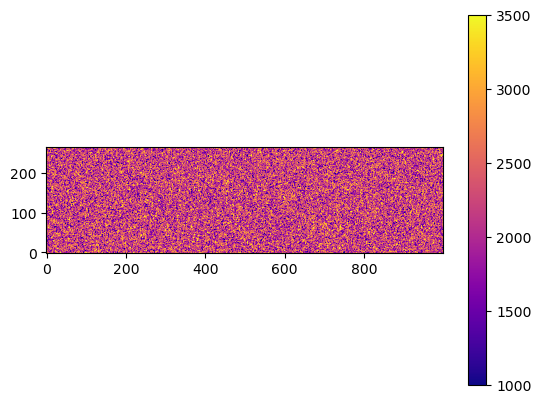

1020000 1021000


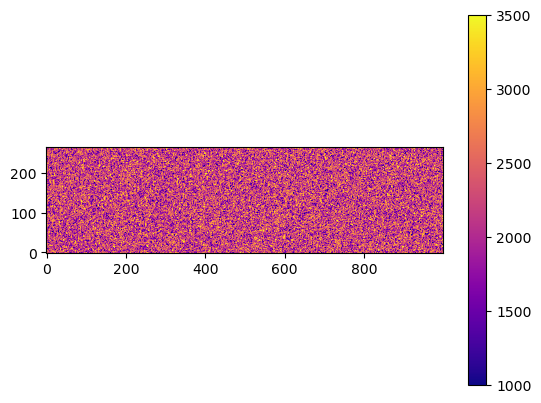

1021000 1022000


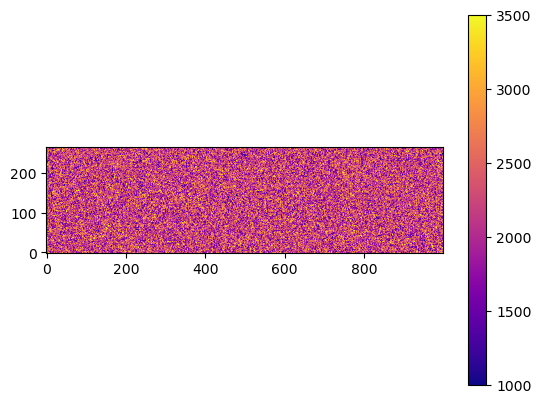

1022000 1023000


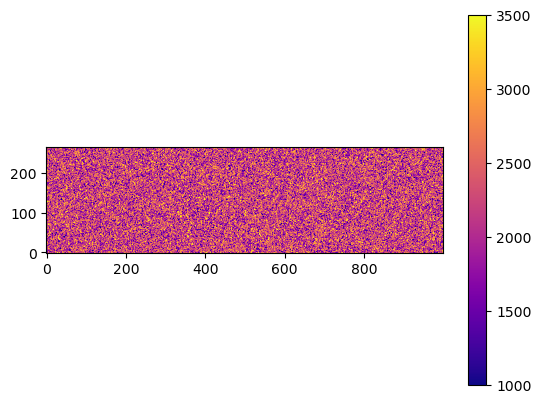

1023000 1024000


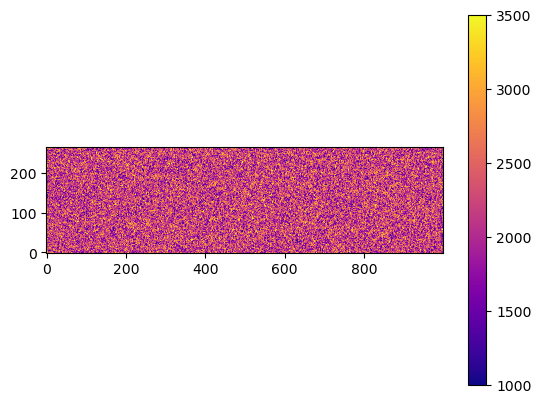

1024000 1025000


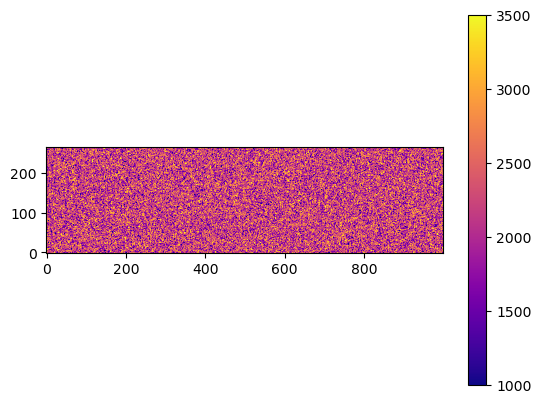

1025000 1026000


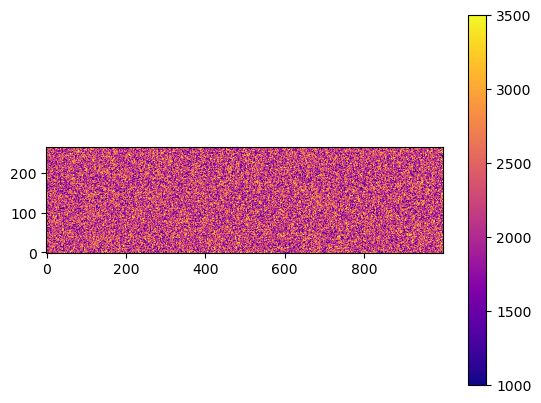

1026000 1027000


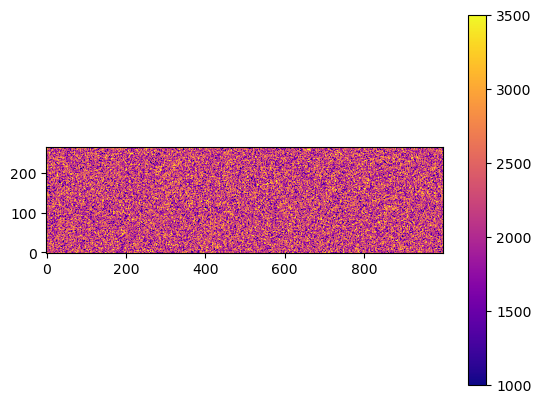

1027000 1028000


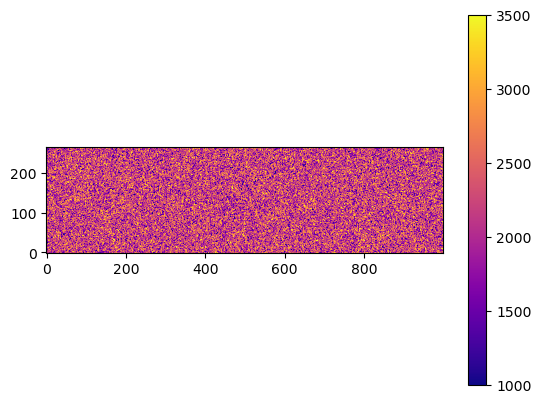

1028000 1029000


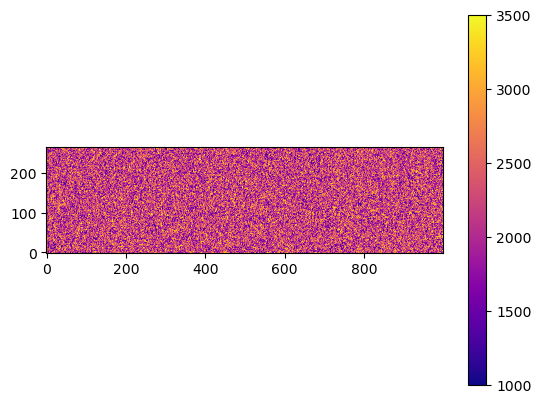

1029000 1030000


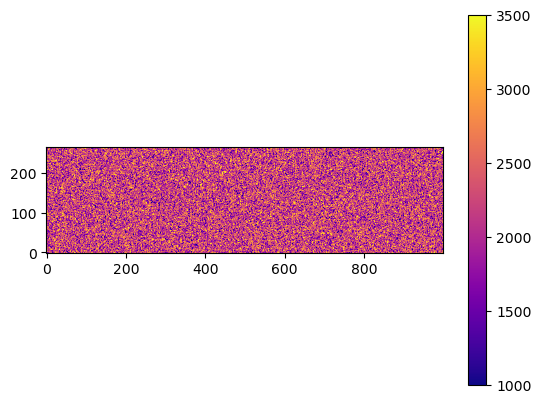

1030000 1031000


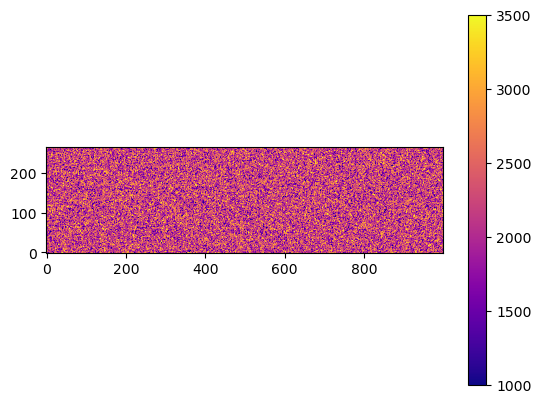

1031000 1032000


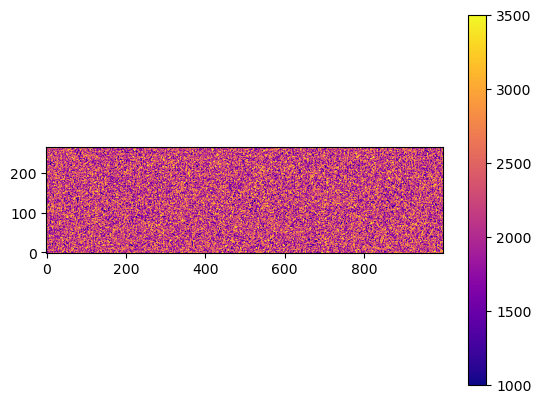

1032000 1033000


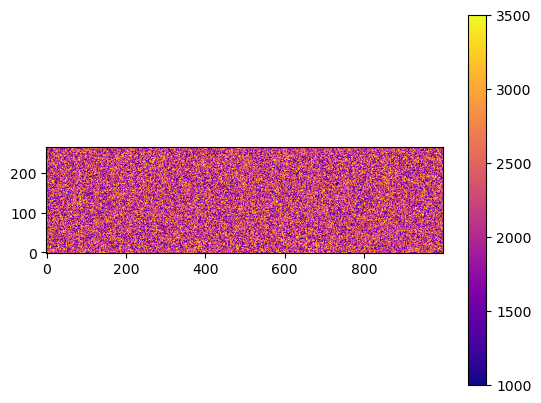

1033000 1034000


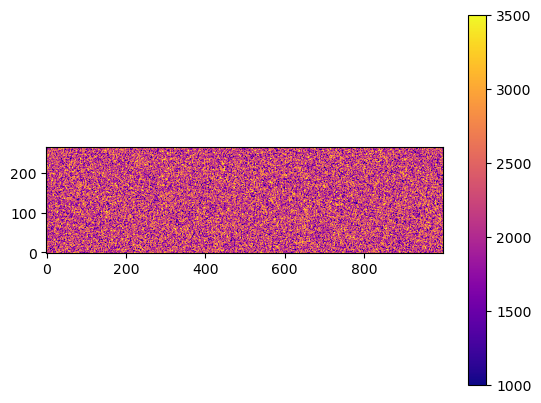

1034000 1035000


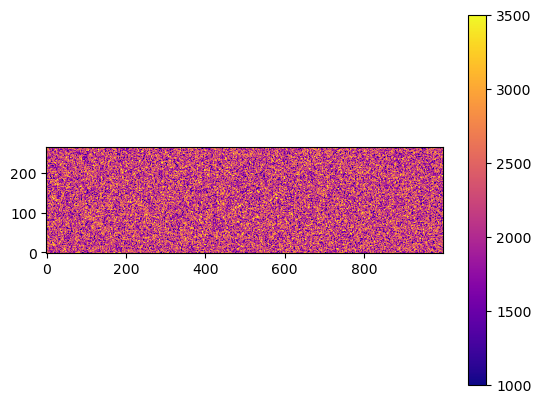

1035000 1036000


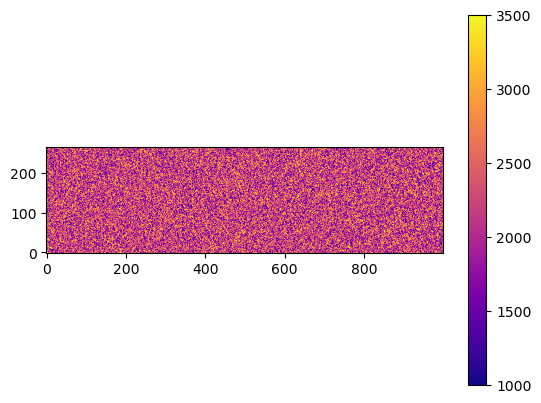

1036000 1037000


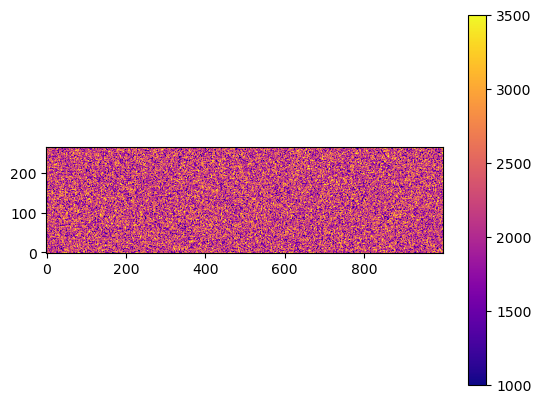

1037000 1038000


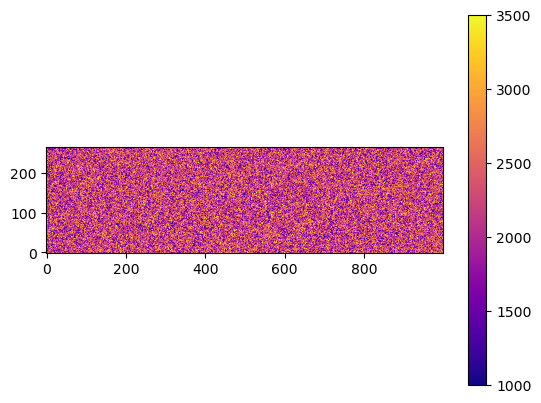

1038000 1039000


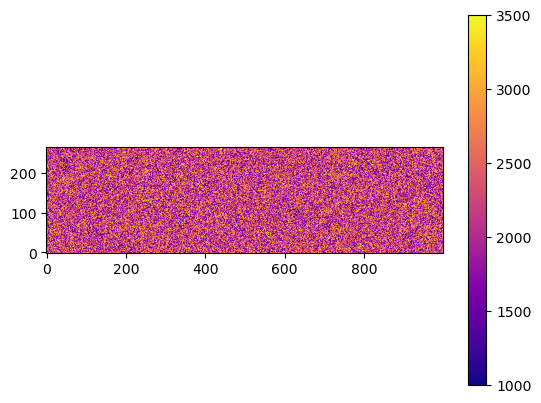

1039000 1040000


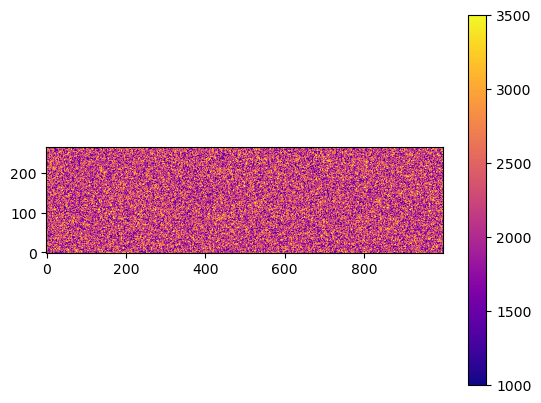

1040000 1041000


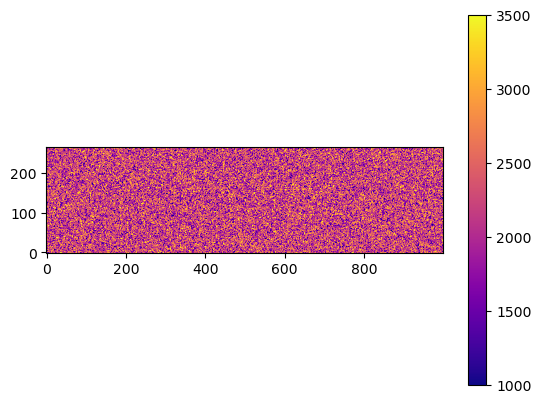

1041000 1042000


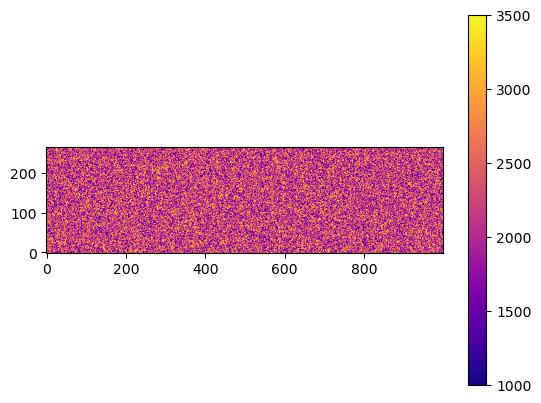

1042000 1043000


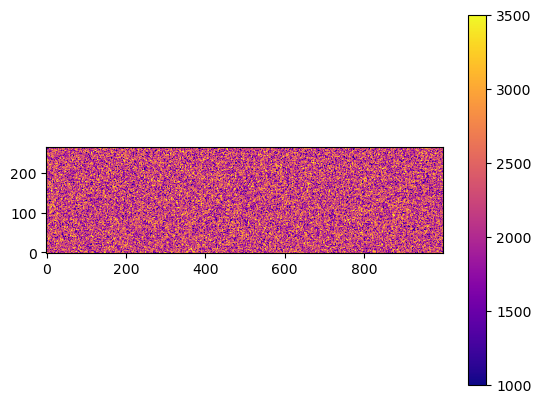

1043000 1044000


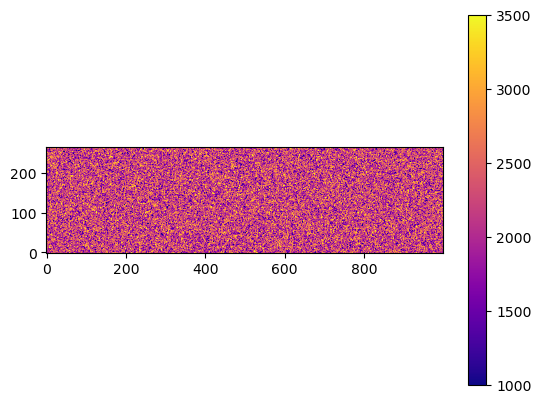

1044000 1045000


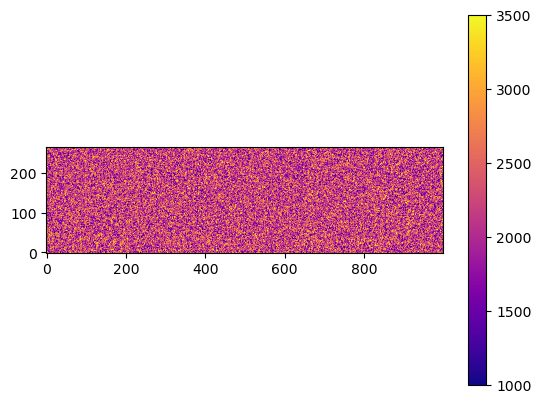

1045000 1046000


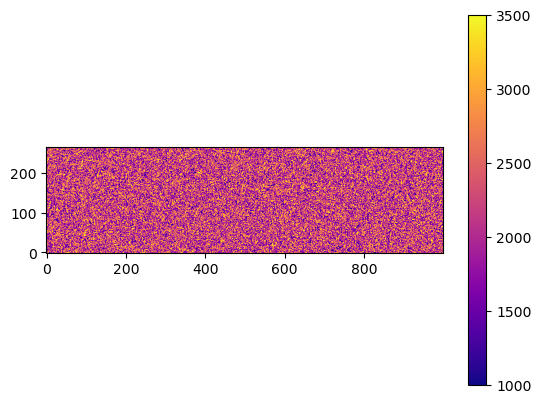

1046000 1047000


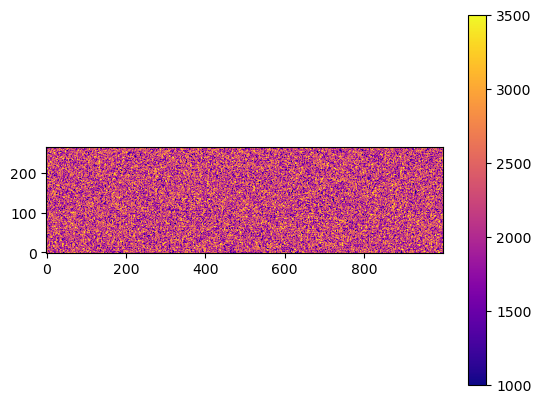

1047000 1048000


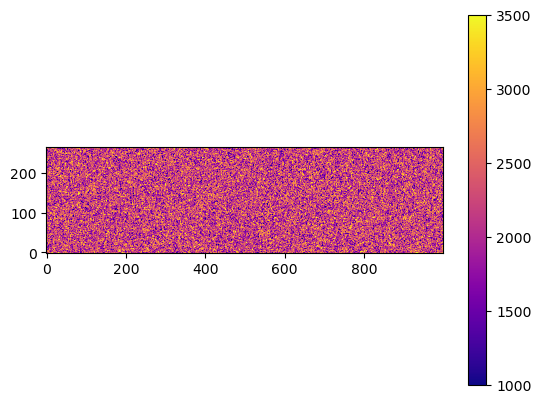

1048000 1049000


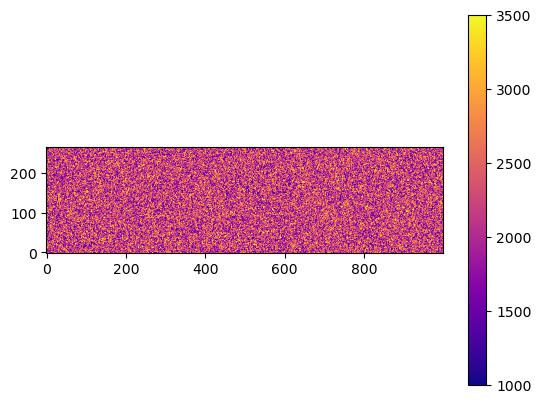

1049000 1050000


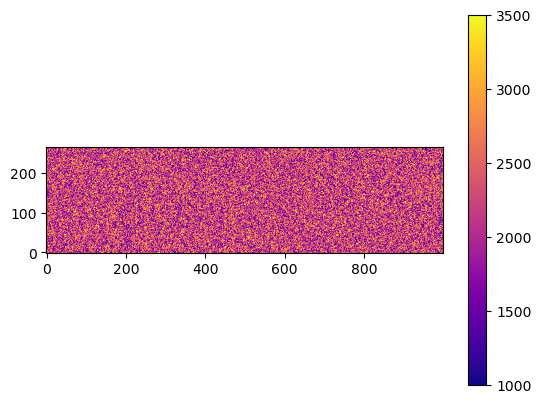

In [37]:
low = 1050000
high = 1001000
for j in range(50):
    plt.imshow(result[:, low:high], vmin=1000, vmax=3500, origin='lower', cmap='plasma')
    print(low, high)
    plt.colorbar()
    plt.show()
    low +=1000
    high +=1000